   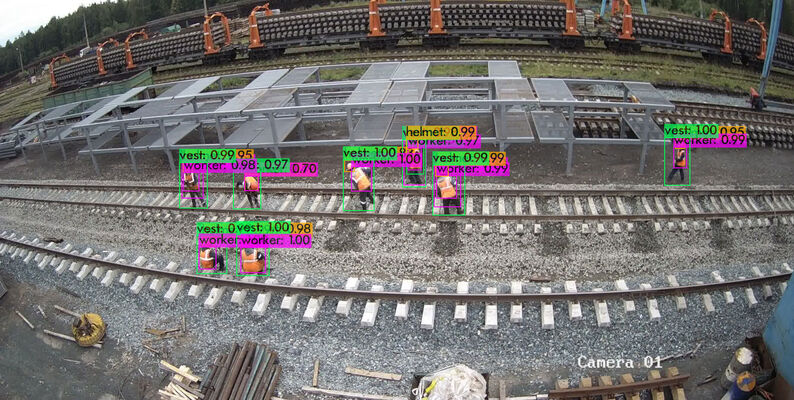
   
**Railroad Worker Detection Dataset**

This dataset contains more then 3 thousands yolo-format labeled images, in this project we will be building a custom yolo v5 model, trained on our data to detect workers, safety helmets and reflective vest. 

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

**Importing Libraries**

In [2]:
import numpy as np
import cv2
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import os
import glob
import shutil
from pathlib import Path
import torch

In [3]:
# setting up file paths
file_path = '/kaggle/input/railroad-worker-detection-dataset/dataset'
img_path = '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs'
ann_path = '/kaggle/input/railroad-worker-detection-dataset/dataset/txt'

**Visualize some images for EDA**

3222
16_0000056.jpg
(1920, 1080)


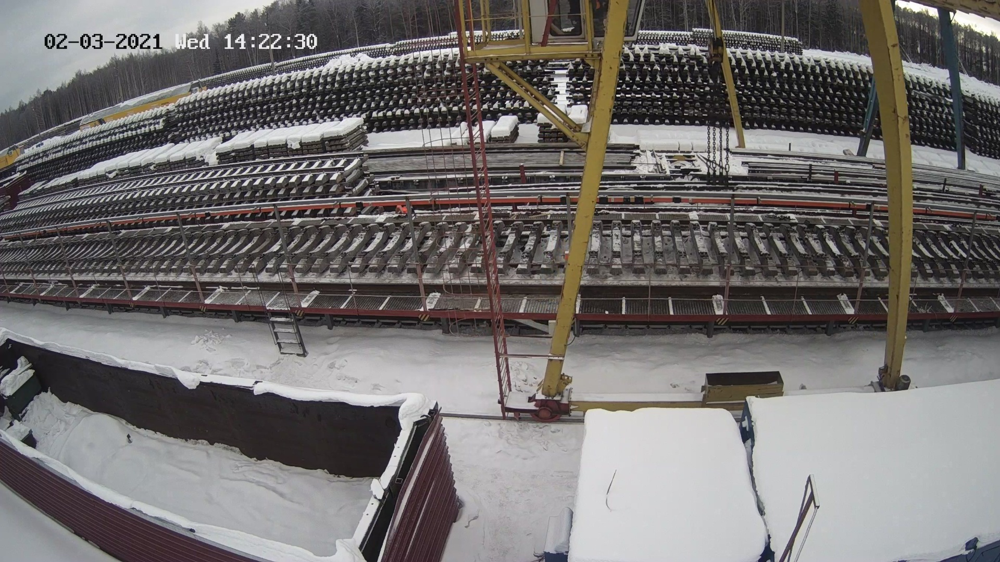

In [4]:
img_list = glob.glob(os.path.join(img_path , "*.jpg"))
print(len(img_list))
print(os.path.basename(img_list[0]))
# print(img_list[0])
im = Image.open(img_list[0])
print(im.size)
im

In [5]:
#Get some annotations from an image
ann_list = glob.glob(os.path.join(ann_path , "*.txt"))
# print(ann_list[0])
file = os.path.basename(img_list[0])
file_name = file[:-3] + 'txt'
print(file_name) 
my_file = open((ann_path + '/' + file_name), "r")
# reading the file
data = my_file.read()
data_into_list = data.split("\n")
print(data_into_list)
my_file.close()

16_0000056.txt
['0 0.402344 0.372222 0.012500 0.016667', '']


In [6]:
# A function to load a select a set amount of images
import random
def loadImages(path, num):
    # return array of images
    imgList = os.listdir(path)
    loadedImages = []
    #iterate a defined number of times
    for i in range(num):
        #select a random index within the img list length
        ind = random.randint(1,len(imgList))
        img = Image.open(path + imgList[ind])
        loadedImages.append(img)
    return loadedImages

path = '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs/'
img_data = loadImages(path, 15)

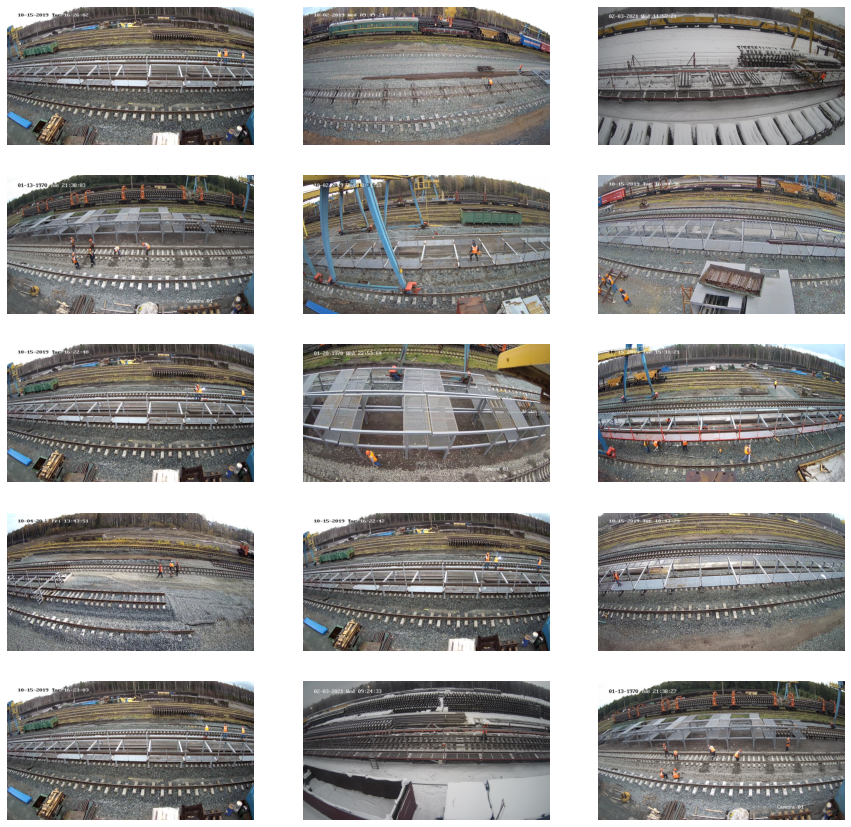

In [7]:
plt.figure(figsize=(15,15))
for i in range(15):
    plt.subplot(5,3,i+1)
    plt.imshow(img_data[i])
    plt.axis('off')

In [8]:
# Function to load images and their respective annotations
class_list = ['vest', 'helmet', 'worker']
import random
def loadImgAnn(img_path, ann_path):
    # return array of images
    imgList = os.listdir(img_path)
    annList = os.listdir(ann_path)
    #create lists to hold our values
    loadedImages = []
    loadedAnn = []
    #iterate a defined number of times
    for i in range(2):
        #select a random index within the our list length
        ind = random.randint(1,len(imgList))
        img = Image.open(img_path + imgList[ind])
        #As both images and annotations are named exactly, we get the annotations for each img
        file = os.path.basename(img_path + imgList[ind])
        file_name = file[:-3] + 'txt' #replacing the extensions to txt from jpg on our filename
        #open our annotation path
        ann = open((ann_path + file_name), 'r')
        data = ann.read()
        data_into_list = data.split("\n")
        loadedAnn.append(data_into_list)
        ann.close()
        loadedImages.append(img)
        print(file, file_name)
    return loadedImages, loadedAnn

In [9]:
img_path = '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs/'
ann_path = '/kaggle/input/railroad-worker-detection-dataset/dataset/txt/'
images_list, annot_list = loadImgAnn(img_path, ann_path)

1358.jpg 1358.txt
15_0000035.jpg 15_0000035.txt


In [10]:
#Better to transform this code to a function later on
# print(ann_list)
coords = []
for i in annot_list:
    temp = []
    for x in i:
        y = x.split(' ')
        temp.append(y)
    coords.append(temp)        
# print(coords)

#To transform the in the list to float values 
float_coords = [] 
for x in coords:
    temp2=[]
#     print(x)
    for y in x:
        temp = []
#         print(y)
        for z in y:
            if z !='':
#                 print(z)
                temp.append(float(z))
#                 print(temp)
        temp2.append(temp)
#         print(temp)
    float_coords.append(temp2)
float_coords = [ele for ele in float_coords if ele != []]
float_coords

[[[0.0, 0.46406300000000006, 0.500694, 0.026563, 0.048611],
  [0.0,
   0.5648440000000001,
   0.5236109999999999,
   0.023438000000000004,
   0.055556],
  [0.0, 0.9792970000000001, 0.445833, 0.014844, 0.041667],
  [0.0, 0.344141, 0.500694, 0.027343999999999997, 0.045833],
  [0.0, 0.277734, 0.485417, 0.021094, 0.045833],
  [0.0, 0.318359, 0.678472, 0.033594, 0.059722],
  [0.0, 0.254297, 0.629167, 0.019531, 0.055556],
  [1.0, 0.980859, 0.415972, 0.011719000000000002, 0.018056],
  [1.0, 0.575781, 0.4965280000000001, 0.014062, 0.026389],
  [1.0, 0.451172, 0.477778, 0.011719000000000002, 0.027778],
  [1.0, 0.326172, 0.502778, 0.011719000000000002, 0.027778],
  [1.0, 0.275781, 0.45555599999999996, 0.014062, 0.022222],
  [1.0, 0.3125, 0.638889, 0.014062, 0.027778],
  [1.0, 0.259375, 0.5923609999999999, 0.014062, 0.020833],
  [2.0, 0.275781, 0.4965280000000001, 0.032812, 0.1125],
  [2.0, 0.339063, 0.5152780000000001, 0.039062, 0.08611099999999998],
  [2.0, 0.46406300000000006, 0.51527800000000

In [11]:
#To remove the empty list
for i in range(len(float_coords)):
    float_coords[i] = list(filter(None, float_coords[i]))
#     print(float_coords[i])
float_coords

[[[0.0, 0.46406300000000006, 0.500694, 0.026563, 0.048611],
  [0.0,
   0.5648440000000001,
   0.5236109999999999,
   0.023438000000000004,
   0.055556],
  [0.0, 0.9792970000000001, 0.445833, 0.014844, 0.041667],
  [0.0, 0.344141, 0.500694, 0.027343999999999997, 0.045833],
  [0.0, 0.277734, 0.485417, 0.021094, 0.045833],
  [0.0, 0.318359, 0.678472, 0.033594, 0.059722],
  [0.0, 0.254297, 0.629167, 0.019531, 0.055556],
  [1.0, 0.980859, 0.415972, 0.011719000000000002, 0.018056],
  [1.0, 0.575781, 0.4965280000000001, 0.014062, 0.026389],
  [1.0, 0.451172, 0.477778, 0.011719000000000002, 0.027778],
  [1.0, 0.326172, 0.502778, 0.011719000000000002, 0.027778],
  [1.0, 0.275781, 0.45555599999999996, 0.014062, 0.022222],
  [1.0, 0.3125, 0.638889, 0.014062, 0.027778],
  [1.0, 0.259375, 0.5923609999999999, 0.014062, 0.020833],
  [2.0, 0.275781, 0.4965280000000001, 0.032812, 0.1125],
  [2.0, 0.339063, 0.5152780000000001, 0.039062, 0.08611099999999998],
  [2.0, 0.46406300000000006, 0.51527800000000

In [12]:
# Get image coordinates to be plotted on our images
#convert yolo annotations to image coordinates for bounding boxes
def img_coords(coords, img_size):
    img_width = img_size[0]
    img_height = img_size[1]
    
    x1 = float(img_width) * (2.0 * float(coords[1]) - float(coords[3])) / 2.0
    y1 = float(img_height) * (2.0 * float(coords[2]) - float(coords[4])) / 2.0
    x2 = float(img_width) * (2.0 * float(coords[1]) + float(coords[3])) / 2.0
    y2 = float(img_height) * (2.0 * float(coords[2]) + float(coords[4])) / 2.0
    
    return [int(x1), int(y1), int(x2), int(y2)]   

In [13]:
img_size = (1920, 1080)
coords_list = []
for i in float_coords:
    temp = []
    for x in i:
        z = img_coords(x, img_size)
        temp.append(z)
    coords_list.append(temp)
coords_list[0]

[[865, 514, 916, 566],
 [1062, 535, 1107, 595],
 [1866, 458, 1894, 503],
 [634, 515, 687, 565],
 [512, 499, 553, 549],
 [578, 700, 643, 764],
 [469, 649, 506, 709],
 [1871, 439, 1894, 459],
 [1092, 522, 1118, 550],
 [855, 501, 877, 531],
 [615, 528, 637, 558],
 [516, 480, 542, 504],
 [586, 675, 613, 705],
 [484, 628, 511, 650],
 [498, 475, 560, 597],
 [613, 510, 688, 603],
 [846, 496, 936, 616],
 [1059, 516, 1120, 620],
 [1855, 432, 1900, 535],
 [463, 623, 540, 740],
 [571, 668, 648, 766]]

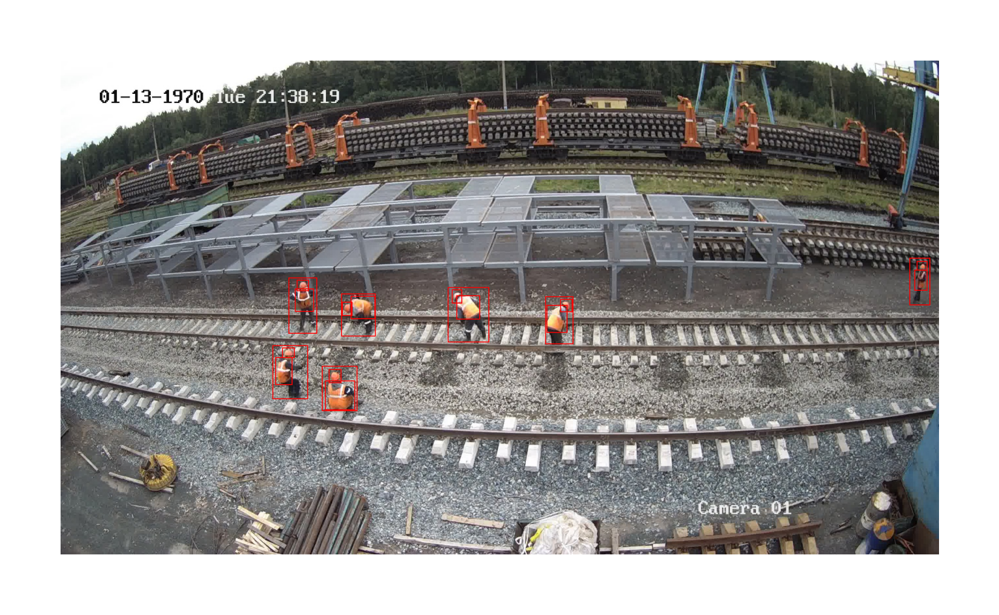

In [14]:
#function to draw images and their annotations
plt.figure(figsize=(1.920,1.080), dpi=1000)
def draw_annot(img, annotList):
    img_copy = img.copy()
    for annot in annotList:
        drawImg = ImageDraw.Draw(img_copy)
        drawImg.rectangle(annot, outline=(255, 0, 0), width=2)
    plt.imshow(img_copy)
    plt.axis('off')
    
draw_annot(images_list[0], coords_list[0])

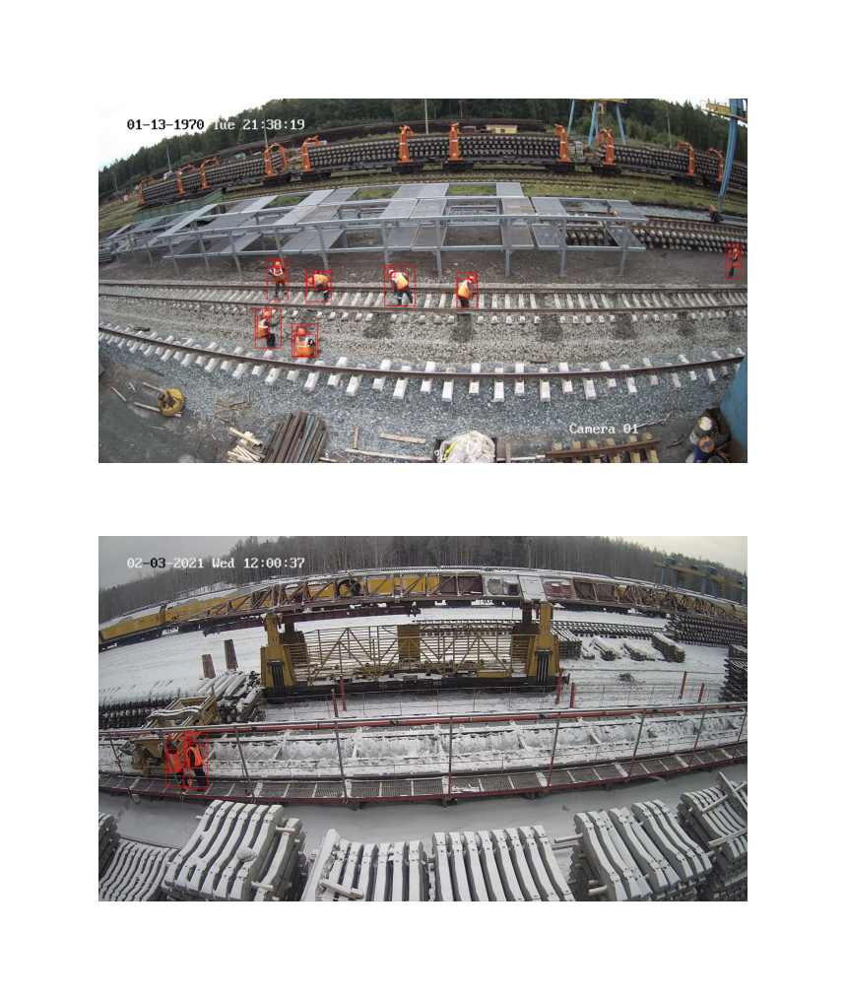

In [15]:
# plt.figure(figsize=(15,15))
plt.figure(figsize=(1.920,1.080), dpi=1000)

for i in range(len(images_list)):
    plt.subplot(2,1,i+1)
    draw_annot(images_list[i], coords_list[i])

**Split our Data**

In [16]:
from sklearn.model_selection import train_test_split
image_list = os.listdir('/kaggle/input/railroad-worker-detection-dataset/dataset/imgs')
train_list, test_list = train_test_split(image_list, test_size=0.2, random_state=42)
val_list, test_list = train_test_split(test_list, test_size=0.3, random_state=42)
print('total =',len(image_list))
print('train :',len(train_list))
print('val   :',len(val_list))
print('test  :',len(test_list))

total = 3222
train : 2577
val   : 451
test  : 194


In [17]:
#Function to create train, test and validation folders
def copy_data(file_list, img_labels_root, imgs_source, mode):
    
    #Check if we have our root folders
    root_file = Path( '/kaggle/working/Dataset/images/'+  mode)
    if not root_file.exists():
        print(f"Path {root_file} does not exit")
        os.makedirs(root_file)

    root_file = Path('/kaggle/working/Dataset/labels/' + mode)
    if not root_file.exists():
        print(f"Path {root_file} does not exit")
        os.makedirs(root_file)
    
    #Creates the name of our label file from the img name and creates our source file
    for file in file_list:               
        img_name = file.replace('.jpg', '')        
        img_src_file = imgs_source + '/' + img_name + '.jpg'        
        label_src_file = img_labels_root + '/' + img_name + '.txt'
        
        #copy image
        IMG_DIR = '/kaggle/working/Dataset/images/'  + mode
        img_dict_file = IMG_DIR + '/' + img_name + '.jpg'
        shutil.copyfile(img_src_file, img_dict_file)

        # Copy label
        LABEL_DIR = '/kaggle/working/Dataset/labels/' + mode
        label_dict_file = LABEL_DIR + '/' + img_name + '.txt'
        shutil.copyfile(label_src_file, label_dict_file)

In [18]:
copy_data(train_list, '/kaggle/input/railroad-worker-detection-dataset/dataset/txt', '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs', "train")
copy_data(val_list, '/kaggle/input/railroad-worker-detection-dataset/dataset/txt', '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs', "val")
copy_data(test_list, '/kaggle/input/railroad-worker-detection-dataset/dataset/txt', '/kaggle/input/railroad-worker-detection-dataset/dataset/imgs', "test")

Path /kaggle/working/Dataset/images/train does not exit
Path /kaggle/working/Dataset/labels/train does not exit
Path /kaggle/working/Dataset/images/val does not exit
Path /kaggle/working/Dataset/labels/val does not exit
Path /kaggle/working/Dataset/images/test does not exit
Path /kaggle/working/Dataset/labels/test does not exit


In [19]:
!ls /kaggle/working/Dataset/images
!ls /kaggle/working/Dataset/labels

test  train  val
test  train  val


In [20]:
lpath = '/kaggle/working/Dataset/labels/test'
llist = glob.glob(os.path.join(lpath , "*.txt"))
# llist[0]
with open(llist[0]) as f:
    file = f.read()
    print(file)

0 0.16953100000000002 0.797917 0.034375 0.079167
1 0.148828 0.763194 0.019531 0.031944
2 0.172656 0.800694 0.071875 0.118056



**Download YOLOv5 model**

In [21]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14570, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 14570 (delta 49), reused 53 (delta 26), pack-reused 14478
Receiving objects: 100% (14570/14570), 13.74 MiB | 23.57 MiB/s, done.
Resolving deltas: 100% (10022/10022), done.


In [22]:
%cd yolov5
!ls

/kaggle/working/yolov5
CITATION.cff	 README.zh-CN.md  detect.py   requirements.txt	tutorial.ipynb
CONTRIBUTING.md  benchmarks.py	  export.py   segment		utils
LICENSE		 classify	  hubconf.py  setup.cfg		val.py
README.md	 data		  models      train.py


In [23]:
#Creating a Yaml file for our yolov5 model
import yaml

dict_file = {'train':'/kaggle/working/Dataset/images/train' ,
            'val': '/kaggle/working/Dataset/images/val',
            'nc' : '3',
            'names' : ['vest','helmet','worker']}

with open('/kaggle/working/yolov5/data/railworkers.yaml', 'w+') as file:
    documents = yaml.dump(dict_file, file)

In [24]:
!ls data

Argoverse.yaml	      SKU-110K.yaml  coco128-seg.yaml  railworkers.yaml
GlobalWheat2020.yaml  VOC.yaml	     coco128.yaml      scripts
ImageNet.yaml	      VisDrone.yaml  hyps	       xView.yaml
Objects365.yaml       coco.yaml      images


**YOLOv5 Model training with Layer Freezing**

In [25]:
!python train.py --data data/railworkers.yaml --weights yolov5m.pt --img 640 --epochs 30 --batch-size 32 --freeze 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14

wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5m.pt, cfg=, data=data/railworkers.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
requirements: YOLOv5 requirement "thop>=0.1.1" not found, attempting AutoUpdate...

requiremen

**Model Inference**

In [26]:
!ls

CITATION.cff	 __pycache__	export.py	  segment	  val.py
CONTRIBUTING.md  benchmarks.py	hubconf.py	  setup.cfg	  yolov5m.pt
LICENSE		 classify	models		  train.py
README.md	 data		requirements.txt  tutorial.ipynb
README.zh-CN.md  detect.py	runs		  utils


In [27]:
!ls runs/train/exp

F1_curve.png					   results.png
PR_curve.png					   train_batch0.jpg
P_curve.png					   train_batch1.jpg
R_curve.png					   train_batch2.jpg
confusion_matrix.png				   val_batch0_labels.jpg
events.out.tfevents.1671350851.b4fd68c5a6be.142.0  val_batch0_pred.jpg
hyp.yaml					   val_batch1_labels.jpg
labels.jpg					   val_batch1_pred.jpg
labels_correlogram.jpg				   val_batch2_labels.jpg
opt.yaml					   val_batch2_pred.jpg
results.csv					   weights


(-0.5, 1919.5, 1919.5, -0.5)

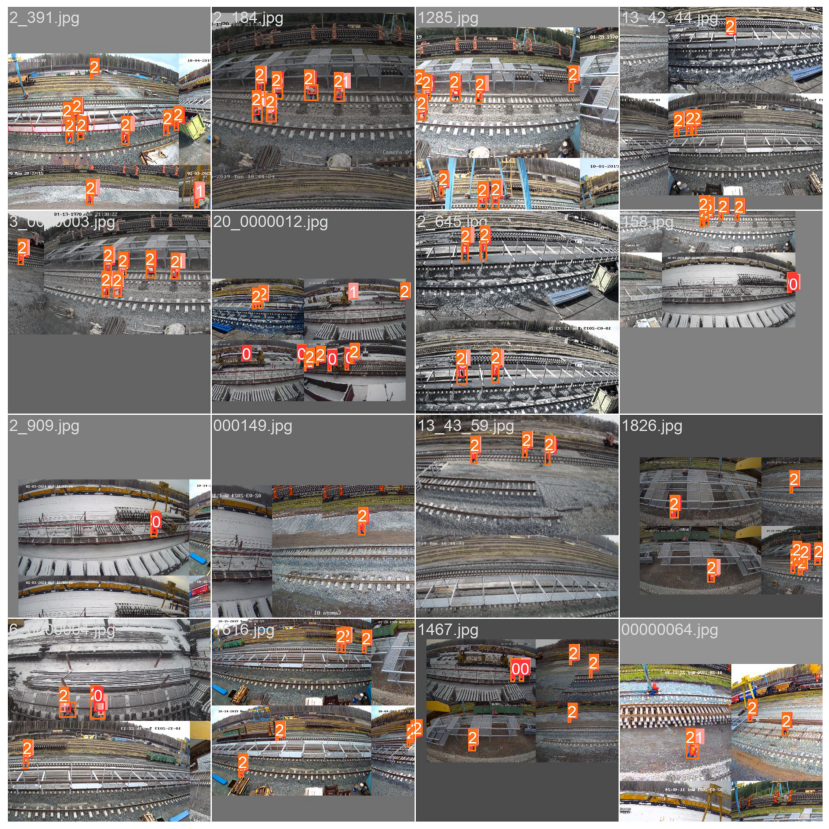

In [28]:
plt.figure(figsize=(15,15))
train_pic = Image.open('runs/train/exp/train_batch0.jpg')
plt.imshow(train_pic)
plt.axis('off')

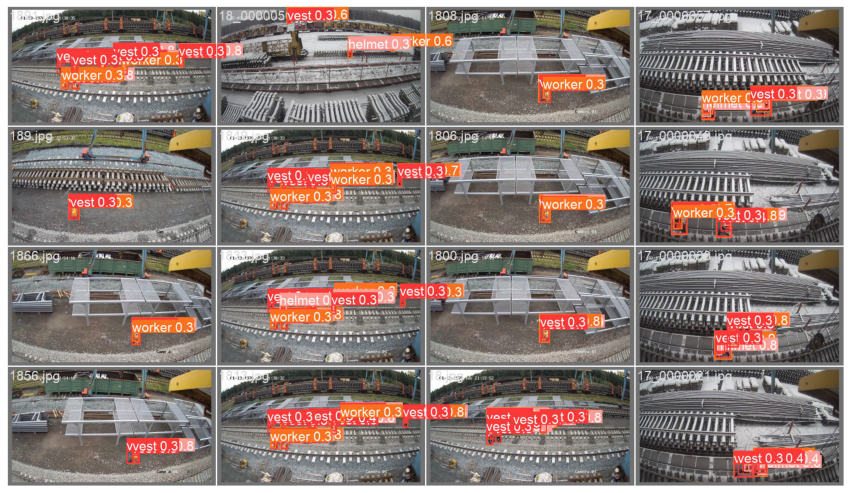

In [29]:
plt.figure(figsize=(15,15))
val_pic = Image.open('runs/train/exp/val_batch1_pred.jpg')
plt.imshow(val_pic)
plt.axis('off')
plt.show()

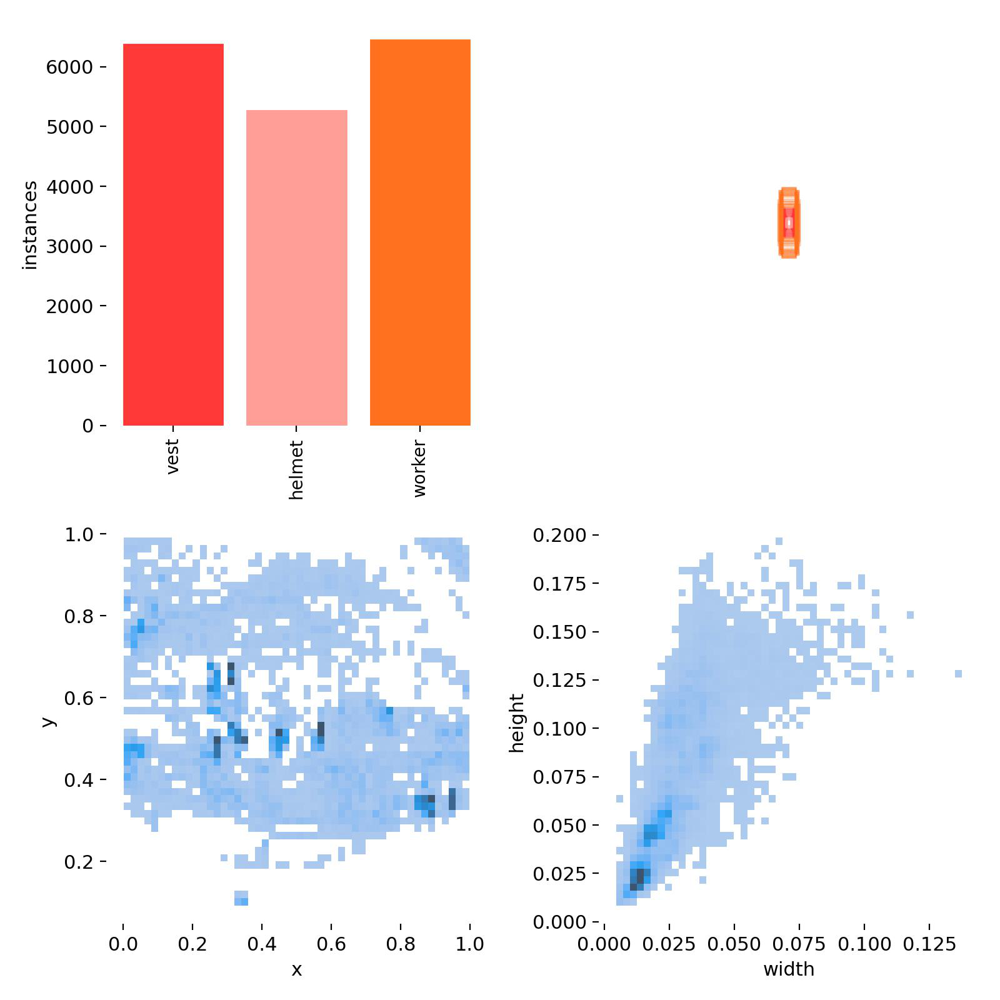

In [30]:
Image.open('runs/train/exp/labels.jpg')

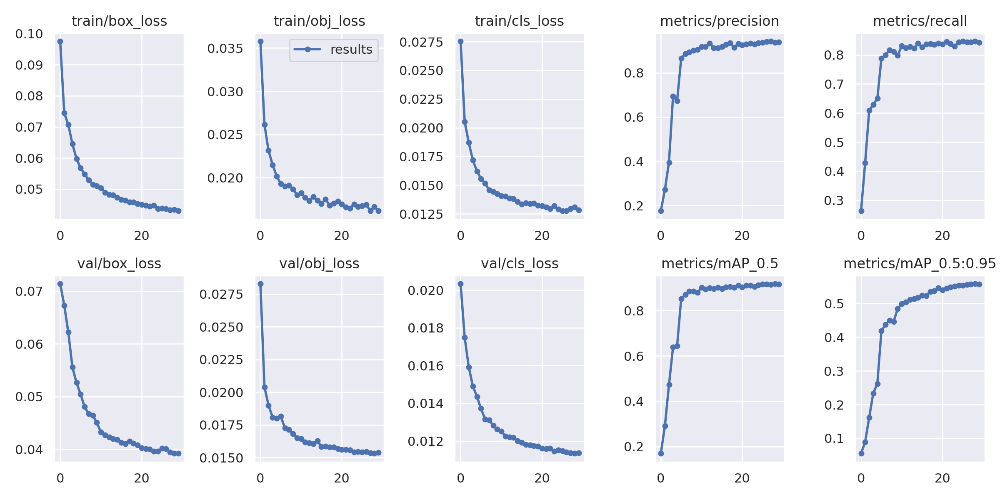

In [31]:
Image.open('runs/train/exp/results.png')

In [32]:
!python detect.py --img 640 --source /kaggle/working/Dataset/images/test --weights runs/train/exp/weights/best.pt --conf-thres 0.4

detect: weights=['runs/train/exp/weights/best.pt'], source=/kaggle/working/Dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-38-g4362372 Python-3.7.12 torch-1.11.0 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 212 layers, 20861016 parameters, 0 gradients, 47.9 GFLOPs
image 1/194 /kaggle/working/Dataset/images/test/00000002.jpg: 384x640 2 vests, 1 helmet, 2 workers, 12.9ms
image 2/194 /kaggle/working/Dataset/images/test/00000013.jpg: 384x640 1 vest, 1 helmet, 1 worker, 10.7ms
image 3/194 /kaggle/working/Dataset/images/test/00000030.jpg: 384x640 1 helmet, 1 worker, 8.5ms
image 4/194 /kagg

In [33]:
!ls runs

detect	train


In [34]:
!ls runs/detect/exp

00000002.jpg  11_0000003.jpg  1668.jpg	      2_246.jpg  2_941.jpg
00000013.jpg  11_0000006.jpg  1672.jpg	      2_257.jpg  578.jpg
00000030.jpg  11_0000012.jpg  16_0000006.jpg  2_292.jpg  583.jpg
00000093.jpg  11_0000018.jpg  16_0000008.jpg  2_294.jpg  591.jpg
00000096.jpg  11_0000019.jpg  16_0000011.jpg  2_311.jpg  592.jpg
00000097.jpg  1211.jpg	      16_0000032.jpg  2_327.jpg  631.jpg
00000117.jpg  1214.jpg	      16_0000044.jpg  2_331.jpg  638.jpg
00000148.jpg  123.jpg	      170.jpg	      2_344.jpg  679.jpg
00000162.jpg  1258.jpg	      1716.jpg	      2_346.jpg  69.jpg
00000165.jpg  1263.jpg	      174.jpg	      2_347.jpg  699.jpg
00000210.jpg  1271.jpg	      1750.jpg	      2_364.jpg  703.jpg
00000211.jpg  12_0000043.jpg  1757.jpg	      2_388.jpg  73.jpg
00000221.jpg  1342.jpg	      1773.jpg	      2_418.jpg  755.jpg
00000295.jpg  1355.jpg	      17_0000014.jpg  2_434.jpg  759.jpg
00000299.jpg  1376.jpg	      17_0000061.jpg  2_452.jpg  774.jpg
000003.jpg    1387.jpg	      1801.jpg	      2

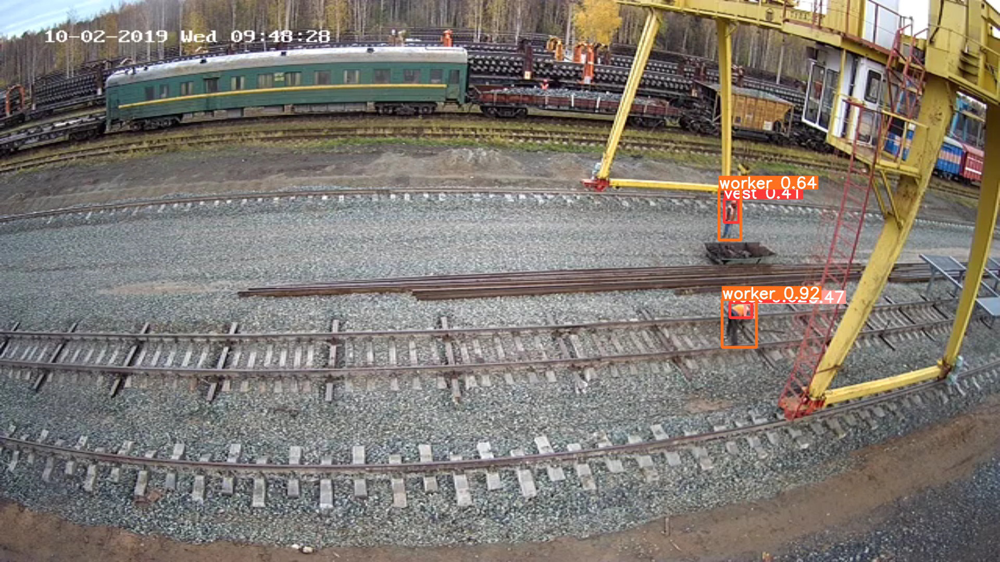

In [35]:
Image.open('runs/detect/exp/00000002.jpg')

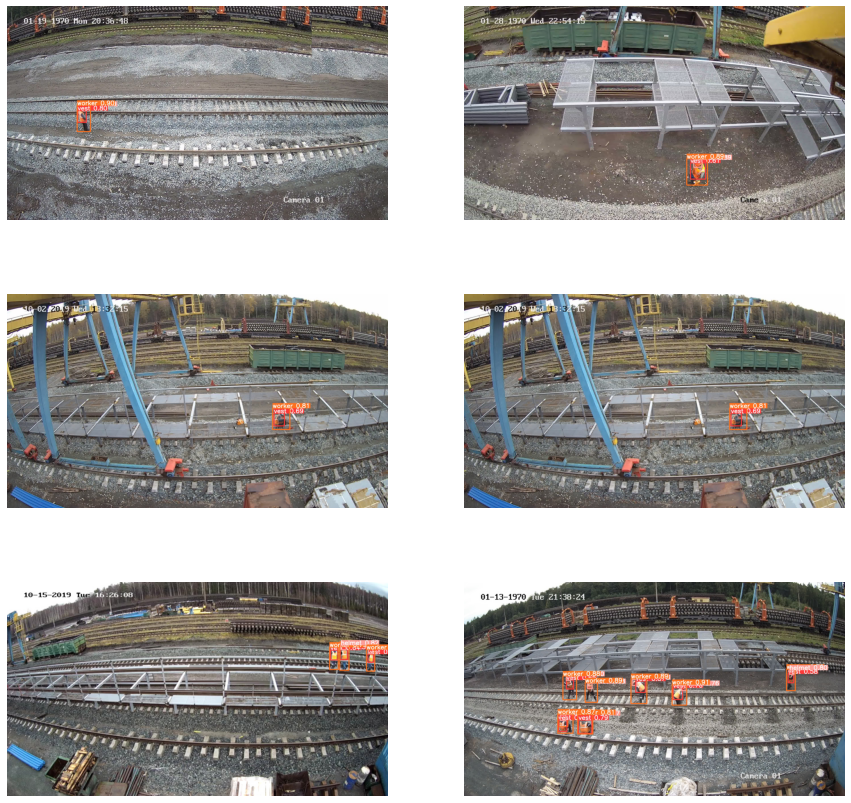

In [36]:
test_data_path = 'runs/detect/exp/'
test_data_img = loadImages(test_data_path, 6)

plt.figure(figsize=(15,15))
for i in range(6):
    plt.subplot(3,2,i+1)
    plt.imshow(test_data_img[i])
    plt.axis('off')

In [ ]:
# !zip -r file.zip .

In [43]:
%cd /kaggle/working/

/kaggle/working


In [44]:
!ls

Dataset  __notebook_source__.ipynb  yolov5


In [ ]:
!zip -r file.zip /kaggle/working/yolov5

In [46]:
!ls

Dataset  __notebook_source__.ipynb  file.zip  yolov5


In [47]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip